In [2]:
import os
from pathlib import Path

import numpy as np
from openslide import OpenSlide
from PIL import Image

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
from violet.utils.preprocessing import extract_svs_tiles
from violet.utils.dataloaders import listfiles

In [6]:
fps = sorted(listfiles('/data/tcia/CCRCC/', regex=r'.svs$'))
fps

['/data/tcia/CCRCC/C3L-00004-21.svs',
 '/data/tcia/CCRCC/C3L-00004-26.svs',
 '/data/tcia/CCRCC/C3L-00010-21.svs',
 '/data/tcia/CCRCC/C3L-00010-26.svs',
 '/data/tcia/CCRCC/C3L-00011-21.svs',
 '/data/tcia/CCRCC/C3L-00011-26.svs',
 '/data/tcia/CCRCC/C3L-00026-21.svs',
 '/data/tcia/CCRCC/C3L-00026-26.svs',
 '/data/tcia/CCRCC/C3L-00079-21.svs',
 '/data/tcia/CCRCC/C3L-00079-26.svs',
 '/data/tcia/CCRCC/C3L-00088-21.svs',
 '/data/tcia/CCRCC/C3L-00088-22.svs',
 '/data/tcia/CCRCC/C3L-00088-26.svs',
 '/data/tcia/CCRCC/C3L-00096-21.svs',
 '/data/tcia/CCRCC/C3L-00096-26.svs',
 '/data/tcia/CCRCC/C3L-00097-21.svs',
 '/data/tcia/CCRCC/C3L-00097-26.svs',
 '/data/tcia/CCRCC/C3L-00103-21.svs',
 '/data/tcia/CCRCC/C3L-00103-22.svs',
 '/data/tcia/CCRCC/C3L-00103-23.svs',
 '/data/tcia/CCRCC/C3L-00103-26.svs',
 '/data/tcia/CCRCC/C3L-00165-21.svs',
 '/data/tcia/CCRCC/C3L-00165-22.svs',
 '/data/tcia/CCRCC/C3L-00165-23.svs',
 '/data/tcia/CCRCC/C3L-00165-24.svs',
 '/data/tcia/CCRCC/C3L-00165-25.svs',
 '/data/tcia

In [7]:
data_map = {fp.split('/')[-1].split('.')[0]:fp for fp in fps}
len(data_map)

782

In [8]:
n = 1
samples = sorted(data_map.keys())
batches = [samples[i:i+n] for i in range(0, len(samples), n)]
len(batches)

782

In [11]:
output_dir = '/home/estorrs/violet/data/he/ffpe/tcia_ccrcc_normalized_wsi'
for sample in samples:
    Path(os.path.join(output_dir, 'train', sample)).mkdir(parents=True, exist_ok=True)
    Path(os.path.join(output_dir, 'val', sample)).mkdir(parents=True, exist_ok=True)

In [12]:
# picking 10% of samples to be validation images
val_samples = np.random.permutation(samples)[:int(len(samples) * .1)]
val_samples

array(['C3L-01681-27', 'C3N-02723-26', 'C3N-02945-23', 'C3N-00194-23',
       'C3N-03021-21', 'C3L-00183-22', 'C3L-00966-23', 'C3L-00910-22',
       'C3L-01976-26', 'C3N-00646-21', 'C3L-00165-23', 'C3N-00380-24',
       'C3L-00968-22', 'C3L-00369-21', 'C3L-02556-26', 'C3N-01220-22',
       'C3N-01261-23', 'C3L-00561-21', 'C3L-00004-26', 'C3N-02068-23',
       'C3N-00305-22', 'C3N-00244-26', 'C3N-00317-22', 'C3L-00790-22',
       'C3N-00390-22', 'C3N-00310-25', 'C3N-00953-22', 'C3N-00149-24',
       'C3N-00380-23', 'C3L-01665-21', 'C3L-00991-22', 'C3N-00310-21',
       'C3L-01352-21', 'C3N-01200-24', 'C3L-00970-22', 'C3N-02811-22',
       'C3N-01088-22', 'C3N-03019-25', 'C3L-02201-22', 'C3N-00312-24',
       'C3L-00561-22', 'C3L-00966-21', 'C3N-00320-24', 'C3L-01929-22',
       'C3L-00583-23', 'C3N-00492-24', 'C3N-00244-23', 'C3L-01676-23',
       'C3L-00447-26', 'C3N-01651-25', 'C3N-00149-23', 'C3L-02220-21',
       'C3N-00733-26', 'C3L-00416-26', 'C3L-00606-26', 'C3N-03018-26',
      

In [ ]:
for i, b in enumerate(batches):
    print(i)
    try:
        imgs, img_ids = extract_svs_tiles({k:v for k, v in data_map.items() if k in b},
                                          resolution=55.)
    except MemoryError:
        imgs, img_ids = [], []
        print(f'batch {i} failed due to memory error')

    for img, img_id in zip(imgs, img_ids):
        sample = '_'.join(img_id.split('_')[:-2])
        
        try:
            im = Image.fromarray(img)

            if sample in val_samples:
                im.save(os.path.join(output_dir, 'val', sample, f'{img_id}.jpeg'))
            else:
                im.save(os.path.join(output_dir, 'train', sample, f'{img_id}.jpeg'))
        except TypeError:
            print(f'{sample} with shape {img.shape} failed to save')
    
    del imgs, img_ids

0
1
2
3
4
5
6
7
8
9


In [27]:
X[0]

array([[[239, 242, 242],
        [240, 242, 242],
        [240, 242, 242],
        ...,
        [244, 243, 244],
        [244, 243, 244],
        [244, 243, 244]],

       [[242, 244, 240],
        [240, 242, 242],
        [240, 242, 242],
        ...,
        [244, 243, 244],
        [244, 243, 244],
        [244, 244, 244]],

       [[243, 242, 240],
        [242, 242, 242],
        [242, 242, 242],
        ...,
        [247, 249, 247],
        [249, 250, 238],
        [246, 245, 228]],

       ...,

       [[108, 104, 155],
        [107,  95, 152],
        [107,  92, 149],
        ...,
        [ 98,  65, 100],
        [121,  86, 113],
        [158, 125, 148]],

       [[148, 135, 178],
        [143, 122, 177],
        [133, 114, 169],
        ...,
        [ 91,  67, 111],
        [101,  75, 118],
        [132, 100, 144]],

       [[193, 169, 209],
        [181, 157, 204],
        [165, 143, 196],
        ...,
        [100,  75, 121],
        [102,  82, 127],
        [129, 105, 149]]

###### sandbox

In [10]:
o = OpenSlide(fps[0])

In [76]:
mpp, mag = float(o.properties['aperio.MPP']), int(o.properties['aperio.AppMag'])
mpp, mag

(0.4942, 20)

In [77]:
o.dimensions

(25895, 23396)

In [78]:
o.associated_images

<_AssociatedImageMap {'label': <PIL.Image.Image image mode=RGBA size=666x716 at 0x7F52FBDEEA30>, 'macro': <PIL.Image.Image image mode=RGBA size=1600x629 at 0x7F52FBDEEE50>, 'thumbnail': <PIL.Image.Image image mode=RGBA size=850x768 at 0x7F52FBDEEFD0>}>

In [19]:
img = o.read_region((0, 0), 0, o.dimensions)

In [24]:
img = np.array(img)
img

array([[[243, 243, 243, 255],
        [243, 243, 243, 255],
        [243, 243, 243, 255],
        ...,
        [243, 243, 244, 255],
        [242, 242, 244, 255],
        [242, 242, 242, 255]],

       [[243, 243, 243, 255],
        [243, 243, 243, 255],
        [243, 243, 243, 255],
        ...,
        [243, 242, 244, 255],
        [242, 242, 244, 255],
        [242, 242, 242, 255]],

       [[243, 243, 243, 255],
        [243, 243, 243, 255],
        [243, 243, 243, 255],
        ...,
        [242, 242, 243, 255],
        [242, 242, 243, 255],
        [241, 242, 242, 255]],

       ...,

       [[244, 244, 244, 255],
        [244, 244, 244, 255],
        [244, 244, 244, 255],
        ...,
        [244, 244, 244, 255],
        [244, 244, 244, 255],
        [244, 244, 244, 255]],

       [[245, 245, 245, 255],
        [245, 245, 245, 255],
        [245, 245, 245, 255],
        ...,
        [245, 245, 243, 255],
        [245, 245, 243, 255],
        [245, 245, 243, 255]],

       [[243

In [25]:
img.shape

(23396, 25895, 4)

In [28]:
np.count_nonzero(img[:, :, 3].flatten()!=255)

0

In [29]:
img = img[:, :, :-1]
img.shape

(23396, 25895, 3)

In [85]:
# shred to 55 micron tiles to match st data sizes
d = 55.
tile_size = int(d / mpp)
tile_size

111

In [119]:
5. // 2.

2.0

In [86]:
n_rows = img.shape[0] // tile_size
n_cols = img.shape[1] // tile_size
n_rows, n_cols

(210, 233)

A pixel in a patch was considered background if the mean RGB value was lower than or equal to 220 (that is, close to white), and a patch was removed if more than 50% of the pixels were considered background.

In [140]:
def is_background(tile, thresh=220., coverage=.5):
    means = np.mean(tile, axis=-1)
    n_background = np.count_nonzero(means>=thresh)
    pct_background = n_background / (means.shape[0] * means.shape[1])
    if pct_background >= coverage:
        return True
    else:
        return False

In [141]:
imgs, img_ids = [], []
s_id = 'test1'
for r in range(n_rows):
    for c in range(n_cols):
        tile = img[r * tile_size:(r + 1) * tile_size, c * tile_size:(c + 1) * tile_size]
        if not is_background(tile):
            imgs.append(tile)
            img_ids.append(f'{s_id}_{r}_{c}')
len(imgs), img_ids[:5]

(13641,
 ['test1_34_145',
  'test1_34_146',
  'test1_34_147',
  'test1_34_148',
  'test1_35_137'])

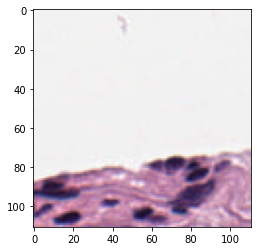

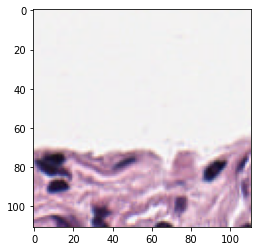

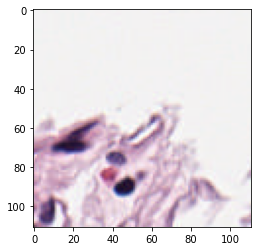

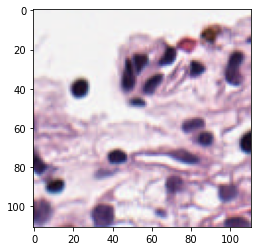

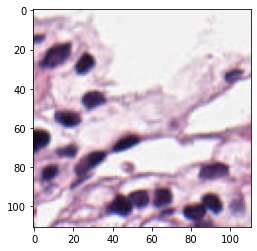

...

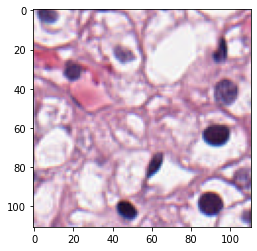

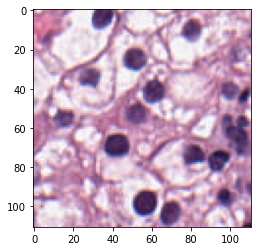

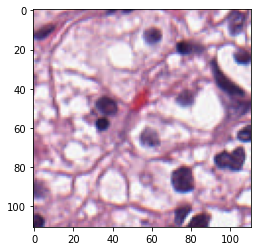

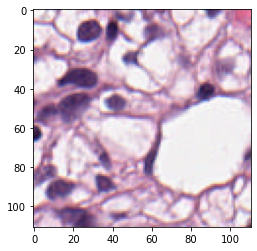

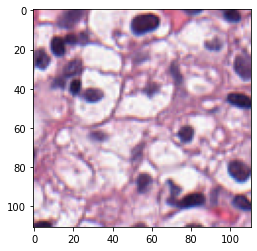

In [139]:
for i in range(0, 100, 1):
    plt.imshow(imgs[i])
    plt.show()

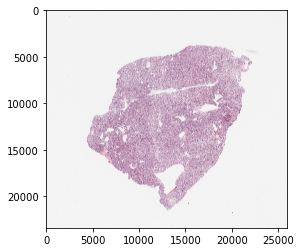

In [57]:
plt.imshow(img)

In [13]:
for k, v in o.properties.items():
    print(k, v)

aperio.AppMag 20
aperio.DSR ID aperio04
aperio.Date 07/06/16
aperio.DisplayColor 0
aperio.Exposure Scale 0.000001
aperio.Exposure Time 109
aperio.Filename 98035
aperio.Focus Offset -0.000500
aperio.ICC Profile ScanScope v1
aperio.ImageID 98035
aperio.Left 20.029867
aperio.LineAreaXOffset 0.023001
aperio.LineAreaYOffset -0.006920
aperio.LineCameraSkew 0.001659
aperio.MPP 0.4942
aperio.OriginalHeight 23496
aperio.OriginalWidth 26416
aperio.ScanScope ID SS1553
aperio.StripeWidth 2032
aperio.Time 14:26:34
aperio.Time Zone GMT-04:00
aperio.Top 20.531343
aperio.User 70abd19d-ff94-4884-b621-3f18637afc97
openslide.comment Aperio Image Library v12.0.11 
26416x23496 [0,100 25895x23396] (240x240) JPEG/RGB Q=70|AppMag = 20|StripeWidth = 2032|ScanScope ID = SS1553|Filename = 98035|Date = 07/06/16|Time = 14:26:34|Time Zone = GMT-04:00|User = 70abd19d-ff94-4884-b621-3f18637afc97|MPP = 0.4942|Left = 20.029867|Top = 20.531343|LineCameraSkew = 0.001659|LineAreaXOffset = 0.023001|LineAreaYOffset = -0.006